In [2]:
import sys,copy,os,inspect
if hasattr(sys.modules[__name__], '__file__'):
    _file_name = __file__
else:
    _file_name = inspect.getfile(inspect.currentframe())
CURRENT_FILE_PATH = os.path.dirname(_file_name)
import sys,os
sys.path.append( "D:/code/neuron-vis/neuronvis/neuronVis")
sys.path.append('D://code//neuron-vis/core/code')
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
matplotlib.use('module://matplotlib_inline.backend_inline')
%matplotlib inline

import IONData 
iondata = IONData.IONData()

import numpy as np
import seaborn as sns
import pandas as pd
from scipy.cluster import hierarchy
from collections import Counter

In [3]:
f=open('D:\data\PF-fMOST\WT_fmost_analyzing/neuronlist.txt')
line = f.readline().strip() 
txt=[]
txt.append(line)
while line:  
   line = f.readline().strip()  
   txt.append(line)
f.close()  
print(txt)
neuronlist_WT=txt
neuronlist_WT=[x for x in neuronlist_WT if not x=='']
f=open('D:\data\PF-fMOST/total/143_crelistneuronlist.txt')
line = f.readline().strip() 
txt=[]
txt.append(line)
while line:  
   line = f.readline().strip()  
   txt.append(line)
f.close()  
print(txt)
neuronlist_cre=txt
neuronlist_cre=[x for x in neuronlist_cre if not x=='']
neuronlist=neuronlist_WT+neuronlist_cre

['210661077.swc', '220240001.swc', '220240004.swc', '220240006.swc', '220240031.swc', '220240033.swc', '220240035.swc', '220240036.swc', '220241010.swc', '220241011.swc', '220241012.swc', '220241014.swc', '220241015.swc', '220241018.swc', '220241019.swc', '220241020.swc', '220241021.swc', '220241022.swc', '220241023.swc', '220241024.swc', '220241025.swc', '220241026.swc', '220241027.swc', '220241028.swc', '220241029.swc', '220241031.swc', '220241032.swc', '220241033.swc', '220241034.swc', '220241035.swc', '220241036.swc', '220241043.swc', '220241046.swc', '220241053.swc', '220241054.swc', '220241055.swc', '220241056.swc', '220241058.swc', '220241059.swc', '220241060.swc', '220241061.swc', '220241062.swc', '']
['221624012.swc', '221624013.swc', '221624040.swc', '221624044.swc', '221624045.swc', '221624046.swc', '221624047.swc', '221624048.swc', '221624050.swc', '221624051.swc', '221624053.swc', '221624054.swc', '221624084.swc', '221624085.swc', '221624097.swc', '221624169.swc', '2216241

In [6]:
import matplotlib
import matplotlib.pyplot as plt
matplotlib.use('module://matplotlib_inline.backend_inline')
%matplotlib inline
color=[[255,0,0],[0,255,0],[0,0,255],[128,128,128],[255,0,255],[60,255,175],[255,155,0],[105,155,55],[155,155,205],[132,191,150],[]]
isoprojectmat=[]
columes2=[]
for neuron in neuronlist:
    
    # property = iondata.getNeuronPropertyByID(neuron['sampleid'], neuron['name'])
    # path = "../resource/swc/"+neuron[:6]+"/"+neuron[6:13]+"isoprojection.json"
    path="D:/code/neuron-vis/neuron-vis-wxf/resource/swc/"+neuron[:6]+"/"+neuron[6:13]+"isoprojection.json"
    # print(path)
    csv_array = np.loadtxt(path,dtype=str)
    temp = np.zeros(200)

    if len(csv_array)>2:
        # print(csv_array,len(csv_array))
        for key,val in csv_array:
            temp[int(key)]=val
    temp[0]=0
    # temp[103]=0
    if temp.sum()<10:
        continue
    columes2.append(neuron[:6]+neuron[6:13])
    isoprojectmat.append(temp)

isoproject = np.array(isoprojectmat)
print(isoproject)
isoproject = np.log2(isoproject/1.0+1)
print(isoproject[:,0])
df = pd.DataFrame(isoproject.T,columns=columes2)
df = df[df.any(axis=1)]
# sns.clustermap(df,figsize=[30,30],method='ward',metric='euclidean',row_cluster=True)

[[  0.        0.        0.      ...   0.        0.        0.     ]
 [  0.        0.        0.      ...   0.        0.        0.     ]
 [  0.        0.        0.      ...   0.       12.9226  184.895  ]
 ...
 [  0.        0.        0.      ...   0.        0.        7.09942]
 [  0.        0.      410.051   ...   0.        0.        0.     ]
 [  0.        0.       10.9103  ...   0.        9.81381   0.     ]]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [4]:
from scipy.spatial.distance import squareform
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import linkage, dendrogram, set_link_color_palette
import matplotlib.pyplot as plt
import matplotlib.colors as mcl
import seaborn as sns
from sklearn.decomposition import PCA

class hierarchical_clutering_terminals:#根据terminal进行层级聚类
    #输出每个neuron按聚类排序的脑区数据和每个neuron对应的分类编号
    def __init__(self, neurondata,clustering_method,cluster_distance_threshold,metric):
        
        from scipy.spatial.distance import squareform
        from scipy.cluster.hierarchy import linkage, dendrogram, set_link_color_palette
        import matplotlib.pyplot as plt
        import matplotlib.colors as mcl
        import seaborn as sns
        import pandas as pd
        from scipy.cluster.hierarchy import fcluster
        

        #PCA
        pca = PCA(n_components=20)
        neuron_PCA = pca.fit_transform(neurondata.T)
        print(sum(pca.explained_variance_ratio_))
        
        
        Z=hierarchy.linkage(neurondata.T, method=clustering_method,metric=metric)
        Z_PCA=hierarchy.linkage(neuron_PCA, method=clustering_method,metric=metric)

        cl = fcluster(Z, cluster_distance_threshold, criterion='distance')
        cluster_eachNeuron=pd.DataFrame(cl)
        cluster_eachNeuron['ID']=neurondata.columns
    
        self.Z=Z
        self.cl=cl
        self.cluster_eachNeuron=cluster_eachNeuron
        self.neurondata=neurondata
        
        self.neuron_PCA=neuron_PCA.T
        self.Z_PCA=Z_PCA


In [5]:
clustering_method='ward'
metric='euclidean'
cluster_distance_threshold=105
hierarchical_clutering=hierarchical_clutering_terminals(df,clustering_method,cluster_distance_threshold,metric) 

cluster_eachNeuron=pd.DataFrame(hierarchical_clutering.cl)
cluster_eachNeuron['ID']=df.columns
cluster_eachNeuron.columns=['cluster_id','ID']
#删除神经元数目少于10个的类别
cluster_counter=Counter(cluster_eachNeuron['cluster_id'])
small_cluster=[x for x in cluster_counter if cluster_counter[x]<0]
small_cluster_neuornlist=[]
for n in small_cluster:
    small_cluster_neuornlist+=cluster_eachNeuron[cluster_eachNeuron['cluster_id']== n]['ID'].to_list()
small_cluster_neuornlist

if small_cluster_neuornlist==[]:
    pass
else:

    for n in small_cluster_neuornlist:
        del df[n]
        
    #重新聚类
    hierarchical_clutering=hierarchical_clutering_terminals(df,clustering_method,cluster_distance_threshold,metric) 

    cluster_eachNeuron=pd.DataFrame(hierarchical_clutering.cl)
    cluster_eachNeuron['ID']=df.columns
    cluster_eachNeuron.columns=['cluster_id','ID']


    cluster_counter=Counter(cluster_eachNeuron['cluster_id'])
    small_cluster=[x for x in cluster_counter if cluster_counter[x]<10]
    if small_cluster!=[]:
        print('仍有少于10个的类别')

0.785901276277516


e:\anaconda\envs\neuronVis\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


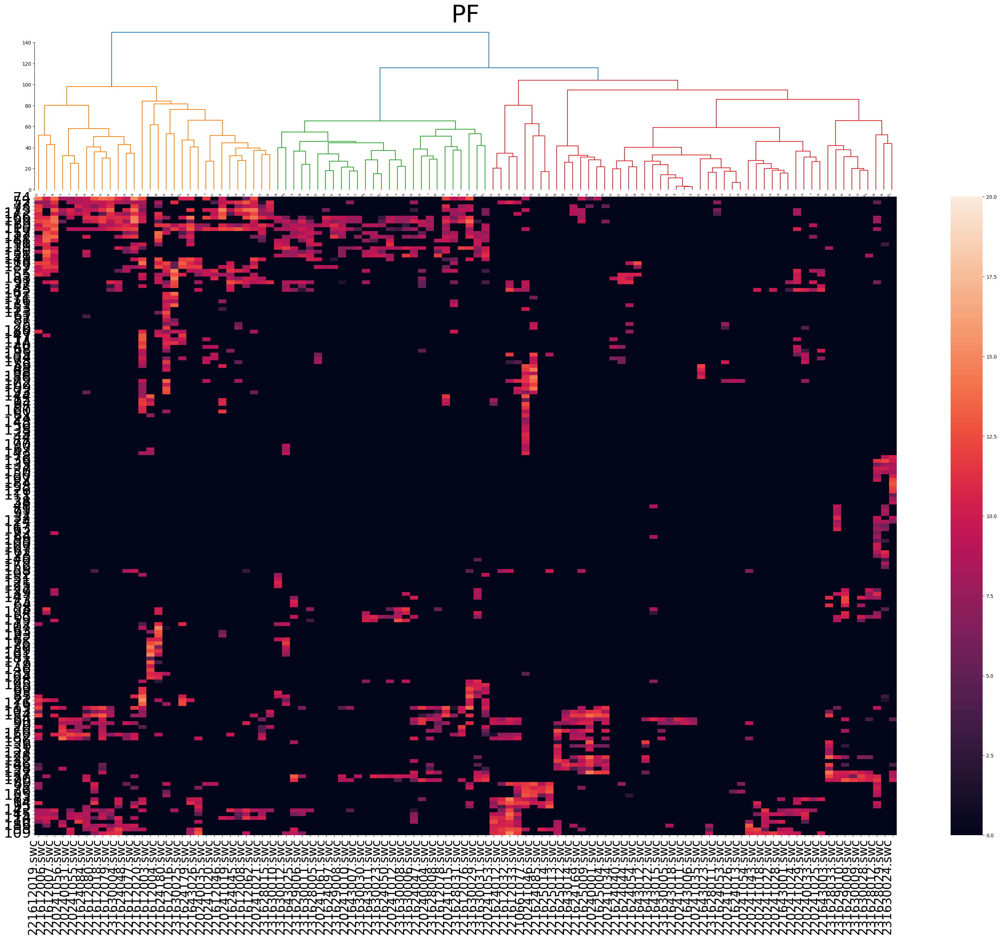

In [6]:
#_________________________________
#作图
%matplotlib inline
cg=sns.clustermap(hierarchical_clutering.neurondata.astype(float),#http://seaborn.pydata.org/generated/seaborn.clustermap.html
            method='ward', #Linkage method to use for calculating clusters. See scipy.cluster.hierarchy.linkage() documentation for more information.
            metric='euclidean',
            #cmap="mako",
            vmin = 0, 
            vmax=0.3,
            figsize=(7, 5),
            row_cluster=True,
            dendrogram_ratio=(.1, .2),
            cbar_pos=(0, .2, .03, .4))#用来获得neuron聚类后排序，不用来直接画图，
col_order = cg.dendrogram_col.reordered_ind
row_order = cg.dendrogram_row.reordered_ind
idx=np.array (col_order)
idr=np.array (row_order)
row_name_order=[]
for i in idr:
    row_name_order.append(df.index[i])
neurondata_sort=df.T.iloc[idx].T
neurondata_sort=neurondata_sort.reindex(row_name_order)
plt.close()

plt.figure(figsize=(40,48))

ax1=plt.subplot2grid((30, 30), (3, 0), colspan=24,rowspan=4) 
dn = hierarchy.dendrogram(hierarchical_clutering.Z,color_threshold=cluster_distance_threshold) #修改聚类层级
ax1 = plt.gca()
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, ha='right')
plt.title("PF",fontsize=50)

ax2 = plt.subplot2grid((30, 30), (7, 0), colspan=30,rowspan=15)
sns.despine(trim=True, bottom=True)
sns.heatmap(neurondata_sort.astype(float),yticklabels=neurondata_sort.index, xticklabels=neurondata_sort.columns,vmax=20)#heatmap
ax2.set_xticklabels(ax2.get_xticklabels(), ha='right',fontsize=25)
plt.yticks(rotation=0,fontsize=30)
# ax2.set_yticklabels(ax2.get_yticklabels(), ha='right',fontsize=30)
plt.rcParams['svg.fonttype']='none'
plt.savefig('D:\Figure/24\paper\s3/PF_cluster_heatmap.pdf')
# plt.savefig('D:\data\PF-fMOST/total/PF_cluster_heatmap.svg')

In [7]:
import GenerateMatrix as GenerateMatrix
neuron_list_sorted=list(neurondata_sort.columns)
generatematrix=GenerateMatrix.GenerateMatrix()
generatematrix.generate_terminal_matrix(neuron_list_sorted,st_level=8,flip=False,normalized=False,terminal=False)
neurondata_st8=generatematrix.terminaldata

json_error=neurondata_st8.sum()[neurondata_st8.sum()==0]
print('error in json',json_error)

221612019.swc
221612006.swc
221612007.swc
220241056.swc
220240031.swc
220241055.swc
221624084.swc
221612080.swc
221612018.swc
221612079.swc
231630004.swc
221624048.swc
221612077.swc
221612020.swc
221612003.swc
221612004.swc
221624180.swc
221612016.swc
231630025.swc
221624179.swc
221643026.swc
220240035.swc
220241020.swc
221612046.swc
220241019.swc
221624045.swc
221612008.swc
221612062.swc
220241021.swc
231628015.swc
231630010.swc
231630012.swc
221643025.swc
231629006.swc
231630011.swc
231628005.swc
220241061.swc
221624097.swc
231629008.swc
220241010.swc
221643007.swc
231630030.swc
221643011.swc
231630023.swc
221624050.swc
220241012.swc
231630008.swc
231630006.swc
221624047.swc
220240004.swc
231628008.swc
221612078.swc
220241015.swc
231628031.swc
221612076.swc
231630029.swc
231630031.swc
220241053.swc
221624012.swc
221612032.swc
221612033.swc
210661077.swc
220241046.swc
221624085.swc
221625014.swc
221625013.swc
221625012.swc
221643014.swc
221624169.swc
221625009.swc
220240001.swc
221625

In [121]:
left_neuronlist=[]
for n in neuronlist:
    somaposition=iondata.getNeuronPropertyByID(n[:6],n[6:])['somapoint']
    if somaposition[2]<5700:
        left_neuronlist.append(n)

In [122]:
#需要翻转的右侧神经元
left_neuronlist_tem=[x for x in neurondata_st8.columns if x in left_neuronlist]

#对右侧脑内神经元进行翻转
left_region=[x for x in neurondata_st8.index if 'left' in x]
right_region=[x for x in neurondata_st8.index if 'right' in x]

for n in left_neuronlist_tem:
    # print(n)
    left_tem=neurondata_st8.loc[left_region,n]
    right_tem=neurondata_st8.loc[right_region,n]
    neurondata_st8.loc[left_region,n]=list(right_tem)
    neurondata_st8.loc[right_region,n]=list(left_tem.values)

neurondata_st8


,221612019.swc,221612006.swc,221612007.swc,220241056.swc,220240031.swc,220241055.swc,221624084.swc,221612080.swc,221612018.swc,221612079.swc,...,220241025.swc,221643003.swc,231628033.swc,231629010.swc,231629009.swc,231630009.swc,231630028.swc,231628012.swc,231628029.swc,231630024.swc
ACA.left,26.717184,236.637573,1660.781677,0.0,0.0,0.0,0.0,0.0,68.049316,0.0,...,0.0,0.0,0.0,34.081657,0.0,0.0,0.0,0.0,0.0,0.0
AI.left,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FRP.left,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MOp.left,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MOs.left,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RR.right,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
VTA.right,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,964.309143,0.0,255.278198,0.0,0.0,0.0,0.0,0.0,0.0
P.right,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PB.right,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [123]:
region_st5_all=['Isocortex',
         'OLF',
         'HPF',
         'CTXsp',
         'STR',
         'PAL',
         'TH',
         'HY',
         'MB',
         'P',
         'MY',
         'CBX',
         'CBN']
 
primary_region=[x for x in neurondata_st8.index if not x[:x.index('.')] in region_st5_all]
neurondata_st8=neurondata_st8.loc[primary_region]
shortneuron=neurondata_st8.sum()[neurondata_st8.sum()<3000].index.to_list()
longneuron=[x for x in neurondata_st8.columns if not x in shortneuron]

neurondata_st8_screen=neurondata_st8
neurondata_st8_screen=neurondata_st8_screen[neurondata_st8_screen>500]# axon length
# neurondata_st8_screen=neurondata_st8_screen[neurondata_st8_screen>10]#
neurondata_st8_screen=neurondata_st8_screen.dropna(axis=0,how='all')
neurondata_st8_screen=neurondata_st8_screen.fillna(0)
neurondata_st8_screen=neurondata_st8_screen.astype(float)

region_tem=(neurondata_st8_screen>0).sum(axis=1)
region_tem=region_tem[region_tem>3].index.to_list()
neurondata_st8_screen=neurondata_st8_screen.loc[region_tem]



neurondata_st8_screen_norm=neurondata_st8_screen/neurondata_st8_screen.sum()
# for b in neurondata_st8_screen_norm.loc[:,neurondata_st8_screen_norm.isnull().all()].columns:
#     del neurondata_st8_screen_norm[b]
#     del neurondata_st8_screen[b]

neurondata_st8_screen_length=neurondata_st8_screen
neurondata_st8_screen=np.log(neurondata_st8_screen+1)
neurondata_st8_screen

,221612019.swc,221612006.swc,221612007.swc,220241056.swc,220240031.swc,220241055.swc,221624084.swc,221612080.swc,221612018.swc,221612079.swc,...,220241025.swc,221643003.swc,231628033.swc,231629010.swc,231629009.swc,231630009.swc,231630028.swc,231628012.swc,231628029.swc,231630024.swc
ACA.right,9.137763,7.122595,8.341777,6.517394,0.000000,0.000000,7.668003,8.738181,9.569306,0.000000,...,0.000000,8.963349,8.065055,9.869112,7.040679,8.849526,8.276371,8.843732,0.000000,6.762511
AI.right,7.034690,6.703862,0.000000,0.000000,7.233457,7.002094,6.995732,8.470210,7.567783,7.977130,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.921761,0.000000,0.000000
FRP.right,8.508158,0.000000,7.573702,6.375934,8.011887,7.387609,8.377001,0.000000,6.855878,7.228261,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MOp.right,9.496466,9.327883,7.975031,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,8.482836,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MOs.right,10.398880,11.294649,11.555222,0.000000,8.195374,8.021825,9.080516,9.004292,10.005185,10.386107,...,7.636504,0.000000,0.000000,7.083307,0.000000,0.000000,0.000000,6.440149,0.000000,0.000000
ORB.right,7.188256,0.000000,6.774850,10.113334,8.668748,8.682094,7.410778,6.555227,8.309757,0.000000,...,0.000000,9.418417,6.865461,6.875869,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
PL.right,9.208183,0.000000,0.000000,0.000000,0.000000,7.030872,7.702276,8.314425,9.114297,7.836500,...,0.000000,10.199948,7.264705,8.322071,8.439127,7.499205,6.788835,6.456611,0.000000,6.797906
SSp.right,7.421275,6.420440,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
RSP.right,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,8.693740,0.000000,0.000000,0.000000,0.000000,8.213007,7.987657,9.476120
SSs.right,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [11]:
#仅留下cortical area
from BrainRegions import BrainRegions
brainregions=BrainRegions()
neurondata_st8_cortex=[]
for x in neurondata_st8_screen.index:
    brainarea=x[:x.index('.')]
    brainarea_st5=brainregions.merge_region(brainarea,5)
    if brainarea_st5=='Isocortex':
        neurondata_st8_cortex.append(x) 
neurondata_st8_screen=neurondata_st8_screen.loc[neurondata_st8_cortex]

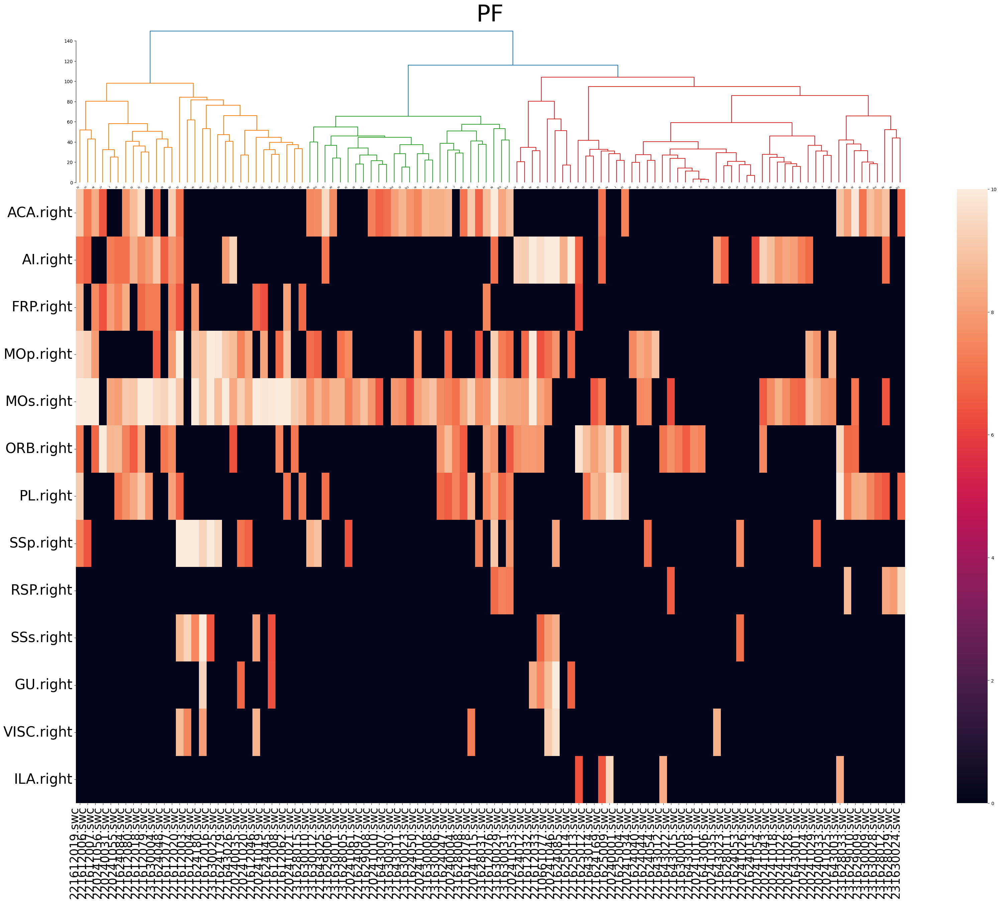

In [57]:
plt.figure(figsize=(40,48))

ax1=plt.subplot2grid((30, 30), (3, 0), colspan=24,rowspan=4) 
dn = hierarchy.dendrogram(hierarchical_clutering.Z,color_threshold=cluster_distance_threshold) #修改聚类层级
ax1 = plt.gca()
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=30, ha='right')
plt.title("PF",fontsize=50)

ax2 = plt.subplot2grid((30, 30), (7, 0), colspan=30,rowspan=15)
sns.despine(trim=True, bottom=True)
sns.heatmap(neurondata_st8_screen.astype(float),yticklabels=neurondata_st8_screen.index, xticklabels=neurondata_st8_screen.columns,vmax=10)#heatmap
ax2.set_xticklabels(ax2.get_xticklabels(), ha='right',fontsize=25)
plt.yticks(rotation=0,fontsize=30)
# ax2.set_yticklabels(ax2.get_yticklabels(), ha='right',fontsize=30)
plt.rcParams['svg.fonttype']='none'

In [12]:
import Scene
for c in set(cluster_eachNeuron['cluster_id']):
    neuronlist_tem=cluster_eachNeuron[cluster_eachNeuron['cluster_id']==c]['ID'].to_list()
    scene_tem=[{'sampleid': x[:6], 'name': x[6:]} for x in neuronlist_tem]
    Scene.createScene(scene_tem,'D:\data\PF-fMOST/total\modulecluster/3Mcluster'+str(c)+'.nv'+'',color='blue')


In [97]:
# 处理掉非基础脑区的信号，过低的噪音
neurondata_st8=neurondata_st8.loc[~(neurondata_st8==0).all(axis=1)]
region_st5_all=['Isocortex',
         'OLF',
         'HPF',
         'CTXsp',
         'STR',
         'PAL',
         'TH',
         'HY',
         'MB',
         'P',
         'MY',
         'CBX',
         'CBN']
 
primary_region=[x for x in neurondata_st8.index if not x[:x.index('.')] in region_st5_all]
neurondata_st8=neurondata_st8.loc[primary_region]
# neurondata_st8=neurondata_st8.drop(index='PF.left')
terminal_sum=neurondata_st8.sum()
propotion_terminal=neurondata_st8.div(terminal_sum)

region_tem=(neurondata_st8>0).sum(axis=1)
region_tem=region_tem[region_tem>10].index.to_list()#排除掉出现少于10次的脑区
neurondata_st8_screen=neurondata_st8.loc[region_tem]
neurondata_st8_screen=neurondata_st8_screen[neurondata_st8_screen>5]#排除掉terminal 数少的
propotion_terminal_log=neurondata_st8_screen.apply(np.log10)
propotion_terminal_log=propotion_terminal_log.fillna(0)
propotion_terminal_log=propotion_terminal_log[(propotion_terminal_log!=0).any(axis=1)]

<Figure size 1600x600 with 0 Axes>

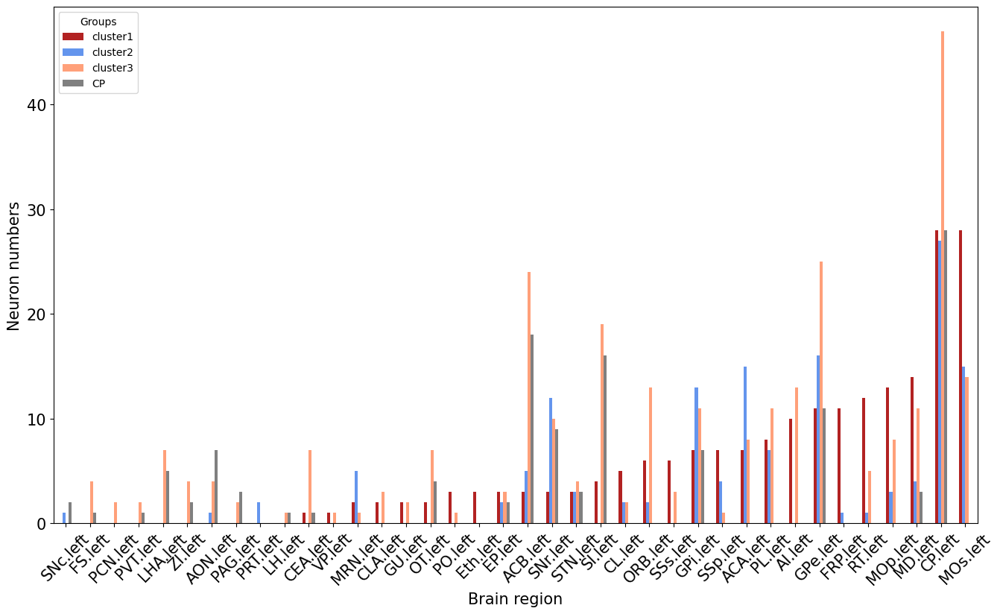

In [144]:
import pandas as pd
import matplotlib.pyplot as plt
columns=['cluster1','cluster2','cluster3','CP']
index=propotion_terminal_log.index
projection_cluster_neuronID=pd.DataFrame(index=index, columns=columns)
for j in range(1,4):
    select_group=[]
    for i in cluster_eachNeuron.index:
       if cluster_eachNeuron['cluster_id'][i]==j:
          select_group.append(cluster_eachNeuron['ID'][i])
          projection_cluster_neuronID['cluster'+str(j)] = (propotion_terminal_log[select_group] != 0).sum(axis=1)
list1=list(cluster_eachNeuron['ID'])
list2=list(propotion_terminal_log.columns)  
CP_group=list(set(list2)-set(list1)) 
projection_cluster_neuronID['CP']=(propotion_terminal_log[CP_group] != 0).sum(axis=1)  
projection_cluster_neuronID=projection_cluster_neuronID.sort_values(by='cluster1')
projection_cluster_neuronID=projection_cluster_neuronID.drop(index='PF.left')
plt.figure(figsize=(16, 6))
colors=['#B22222','#6495ED','#FFA07A','gray']
projection_cluster_neuronID.plot(kind='bar',color=colors)
# 添加标题和标签
plt.xlabel('Brain region',fontsize=15)
plt.ylabel('Neuron numbers',fontsize=15)
plt.xticks(rotation=45,fontsize=15)  # 使 x 轴标签水平显示
plt.yticks(fontsize=15)

plt.legend(title='Groups')

# 显示图形
plt.gcf().set_size_inches(16, 9)
plt.savefig('D:\Figure/24\paper/figure 3/PF_cluster_bar.pdf')
plt.show()
# projection_cluster_neuronID.to_csv('D:\Figure/24\paper/figure 3/projection_cluster_neuronID.csv')       

<Figure size 1600x600 with 0 Axes>

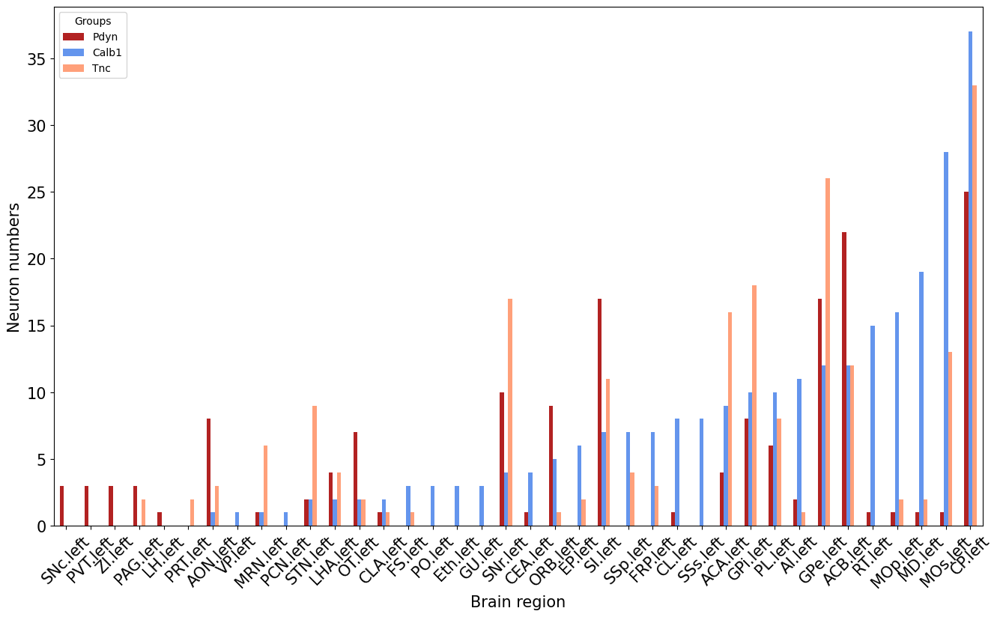

In [152]:
import pandas as pd
import matplotlib.pyplot as plt
neuronsourse=pd.DataFrame(neuronlist_cre,columns=['ID'])
neuronsourse['sourse']=''
for i in range(neuronsourse.shape[0]):
     if neuronsourse['ID'][i] in neuronlist_pdyn:
        neuronsourse['sourse'][i]='Pdyn'        
     elif neuronsourse['ID'][i] in neuronlist_calb:
         neuronsourse['sourse'][i]='Calb1'
     elif neuronsourse['ID'][i] in neuronlist_Tnc:
         neuronsourse['sourse'][i]='Tnc'
     else:
         cluster_eachNeuron['sourse'][i]='WT'


columns=['Pdyn','Calb1','Tnc']
index=propotion_terminal_log.index
projection_cluster_neuronID=pd.DataFrame(index=index, columns=columns)
for j in columns:
    select_group=[]
    for i in neuronsourse.index:
       if neuronsourse['sourse'][i]==j:
          select_group.append(neuronsourse['ID'][i])
          projection_cluster_neuronID[j] = (propotion_terminal_log[select_group] != 0).sum(axis=1)
projection_cluster_neuronID=projection_cluster_neuronID.sort_values(by='Calb1')
projection_cluster_neuronID=projection_cluster_neuronID.drop(index='PF.left')
plt.figure(figsize=(16, 6))
colors=['#B22222','#6495ED','#FFA07A','gray']
projection_cluster_neuronID.plot(kind='bar',color=colors)
# 添加标题和标签
plt.xlabel('Brain region',fontsize=15)
plt.ylabel('Neuron numbers',fontsize=15)
plt.xticks(rotation=45,fontsize=15)  # 使 x 轴标签水平显示
plt.yticks(fontsize=15)

plt.legend(title='Groups')

# 显示图形
plt.gcf().set_size_inches(16, 9)
# plt.savefig('D:\Figure/24\paper/figure 3/PF_cluster_bar.pdf')
plt.show()
# projection_cluster_neuronID.to_csv('D:\Figure/24\paper/figure 3/projection_cluster_neuronID.csv')     

In [153]:
projection_cluster_neuronID

,Pdyn,Calb1,Tnc
SNc.left,3,0,0
PVT.left,3,0,0
ZI.left,3,0,0
PAG.left,3,0,2
LH.left,1,0,0
PRT.left,0,0,2
AON.left,8,1,3
VP.left,0,1,0
MRN.left,1,1,6
PCN.left,0,1,0


In [140]:
import Scene
neruoncluster1=[x['sampleid']+x['name'] for x in Scene.scene2List('E:/NeuronView/data/scene/3Mcluster1.nv')]
neruoncluster2=[x['sampleid']+x['name'] for x in Scene.scene2List('E:/NeuronView/data/scene/3Mcluster2.nv')]
neruoncluster3=[x['sampleid']+x['name'] for x in Scene.scene2List('E:/NeuronView/data/scene/3Mcluster3.nv')]

220240035.swc
221624045.swc
221624048.swc
221624084.swc
221612003.swc
221612004.swc
221612006.swc
221612007.swc
221612008.swc
221612016.swc
221612018.swc
221612019.swc
221612020.swc
221612062.swc
221643026.swc
231628015.swc
231630025.swc


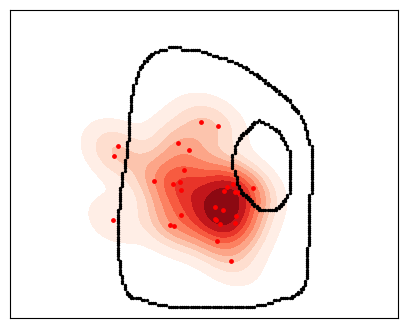

221624047.swc
221624050.swc
221624097.swc
221643025.swc
231628005.swc
231628008.swc
231629006.swc
231629008.swc
231630023.swc
231630029.swc
231630030.swc
231630031.swc


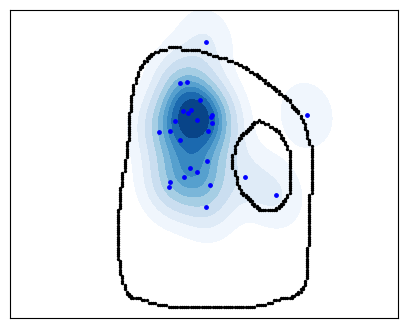

220240033.swc
221624012.swc
221624013.swc
221624040.swc
221624044.swc
221624053.swc
221624054.swc
221624085.swc
221612032.swc
221612033.swc
221625004.swc
221625013.swc
221643022.swc
221643023.swc
231628011.swc
231628012.swc
231629009.swc
231629010.swc
231630024.swc
231630028.swc


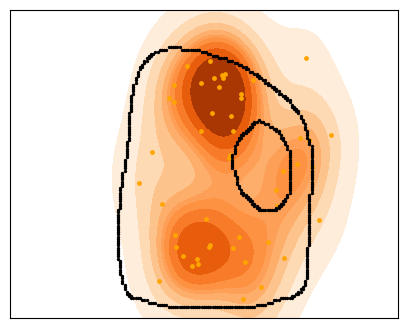

In [143]:
import cv2
# regionlist=br.getRegionList('TH')
# id1=[x[1] for x in regionlist if x[0]=='PF'][0]
# nrrdpath1=iondata.getStructureMask(id1)[1]
# structure_PF,header1=nrrd.read(nrrdpath1)
# structure_PF_coranal=np.rot90(structure_PF,k=1, axes=(0, 2))
# nrrd.write('D:/code/neuron-vis/neuron-vis-wxf/resource/strcture/structure_PF.nrrd', structure_PF_coranal)
structure_PF,header1=nrrd.read('D:/code/neuron-vis/neuron-vis-wxf/resource/strcture/structure_PF-747.nrrd')
kernel = np.ones((2,2),np.uint8)
regiMask_ = cv2.morphologyEx(structure_PF,cv2.MORPH_CLOSE,kernel)
regiEdge_ = cv2.Canny(regiMask_,0,1)
regiEdge_R = np.rot90(regiEdge_ , k=-1)

plt.figure(figsize=(5,4))
plt_soma_x=[]
plt_soma_y=[]
for n in neruoncluster1:
    somapoints=iondata.getNeuronPropertyByID(n[:6],n[6:])['somapoint']
    if somapoints[2]>5700:
        somapoints[2]=11400-somapoints[2]
        print(n)
    plt_soma_x.append(somapoints[2])
    # plt_soma_y.append(13200-somapoints[0])
    plt_soma_y.append(-somapoints[1])

sns.kdeplot(x=plt_soma_x, y=plt_soma_y, fill=True, cmap='Reds', cbar=False,alpha=1)
plt.scatter(plt_soma_x,plt_soma_y,s=6,c='red',marker='o')   
plt.scatter([x*10 for x in np.where(regiEdge_R>0)[1]],[-x*10 for x in np.where(regiEdge_R>0)[0]],s=2,c='black')

plt.axis('equal')
plt.xlim([4500,5500])
plt.ylim([-4500,-3100])
plt.xticks([])
plt.yticks([])
plt.savefig('D:\Figure/24/figure 3/cluster1soma.pdf')
plt.show()



plt.figure(figsize=(5,4))
plt_soma_x=[]
plt_soma_y=[]
for n in neruoncluster2:
    somapoints=iondata.getNeuronPropertyByID(n[:6],n[6:])['somapoint']
    if somapoints[2]>5700:
        somapoints[2]=11400-somapoints[2]
        print(n)
    plt_soma_x.append(somapoints[2])
    # plt_soma_y.append(13200-somapoints[0])
    plt_soma_y.append(-somapoints[1])

sns.kdeplot(x=plt_soma_x, y=plt_soma_y, fill=True, cmap='Blues', cbar=False,alpha=1)
plt.scatter(plt_soma_x,plt_soma_y,s=6,c='blue',marker='o')   
plt.scatter([x*10 for x in np.where(regiEdge_R>0)[1]],[-x*10 for x in np.where(regiEdge_R>0)[0]],s=2,c='black')

plt.axis('equal')
plt.xlim([4500,5500])
plt.ylim([-4500,-3100])
plt.xticks([])
plt.yticks([])
plt.savefig('D:\Figure/24/figure 3/cluster2soma.pdf')
plt.show()


plt.figure(figsize=(5,4))
plt_soma_x=[]
plt_soma_y=[]
for n in neruoncluster3:
    somapoints=iondata.getNeuronPropertyByID(n[:6],n[6:])['somapoint']
    if somapoints[2]>5700:
        somapoints[2]=11400-somapoints[2]
        print(n)
    plt_soma_x.append(somapoints[2])
    # plt_soma_y.append(13200-somapoints[0])
    plt_soma_y.append(-somapoints[1])

sns.kdeplot(x=plt_soma_x, y=plt_soma_y, fill=True, cmap='Oranges', cbar=False,alpha=1)
plt.scatter(plt_soma_x,plt_soma_y,s=6,c='orange',marker='o')   
plt.scatter([x*10 for x in np.where(regiEdge_R>0)[1]],[-x*10 for x in np.where(regiEdge_R>0)[0]],s=2,c='black')

plt.axis('equal')
plt.xlim([4500,5500])
plt.ylim([-4500,-3100])
plt.xticks([])
plt.yticks([])
plt.savefig('D:\Figure/24/figure 3/cluster3soma.pdf')
plt.show()







In [144]:
## flat map 预处理
for c in set(cluster_eachNeuron['sourse']):
    neuronlist_tem=cluster_eachNeuron[cluster_eachNeuron['sourse']==c]['ID'].to_list()
    scene_tem=[{'sampleid': x[:6], 'name': x[6:]} for x in neuronlist_tem]
    Scene.createScene(scene_tem,'D:\data\PF-fMOST/total/gene'+str(c)+'.nv'+'',color='blue')

In [145]:
import sys,copy,os,inspect
import skimage
if hasattr(sys.modules[__name__], '__file__'):
    _file_name = __file__
else:
    _file_name = inspect.getfile(inspect.currentframe())
CURRENT_FILE_PATH = os.path.dirname(_file_name)
sys.path.append(os.getcwd()+"/../neuronVis")
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
matplotlib.use('module://matplotlib_inline.backend_inline')
%matplotlib inline

import IONData 
iondata = IONData.IONData()

0 220240031.swc


e:\anaconda\envs\neuronVis\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)
C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220240031flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 220240035.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220240035flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 220241019.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241019flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 220241020.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241020flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 220241021.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241021flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 220241055.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241055flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 220241056.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241056flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221624045.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624045flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221624048.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624048flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221624084.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624084flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221624179.swc


d:\code\neuron-vis\neuron-vis-wxf\neuronVis\FlatNeuron.py:82: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.subplots(figsize=((maxx-minx)/20,7))
C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624179flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221624180.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624180flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612003.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612003flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612004.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612004flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612006.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612006flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612007.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612007flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612008.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612008flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612016.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612016flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612018.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612018flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612019.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612019flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612020.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612020flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612046.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612046flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612062.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612062flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612077.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612077flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612079.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612079flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221612080.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612080flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 221643026.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643026flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 231628015.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231628015flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 231630004.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630004flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


0 231630025.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630025flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 220240004.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220240004flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 220241010.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241010flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 220241012.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241012flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 220241015.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241015flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 220241061.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241061flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 221624047.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624047flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 221624050.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624050flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 221624097.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624097flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 221612076.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612076flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 221612078.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612078flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 221643007.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643007flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 221643011.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643011flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 221643025.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643025flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231628005.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231628005flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231628008.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231628008flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231628031.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231628031flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231629006.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231629006flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231629008.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231629008flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231630006.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630006flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231630008.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630008flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231630010.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630010flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231630011.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630011flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231630012.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630012flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231630023.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630023flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231630029.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630029flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231630030.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630030flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


1 231630031.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630031flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 210661077.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/210661077flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220240001.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220240001flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220240033.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220240033flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241011.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241011flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241018.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241018flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241022.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241022flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241024.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241024flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241025.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241025flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241026.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241026flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241028.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241028flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241029.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241029flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241034.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241034flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241035.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241035flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241043.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241043flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241046.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241046flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241053.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241053flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 220241054.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/220241054flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221624012.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624012flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221624013.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624013flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221624040.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624040flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221624044.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624044flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221624053.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624053flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221624054.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624054flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221624085.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624085flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221624169.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221624169flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221612032.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612032flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221612033.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221612033flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221625004.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221625004flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221625009.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221625009flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221625012.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221625012flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221625013.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221625013flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221625014.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221625014flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221643001.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643001flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221643003.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643003flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221643006.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643006flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221643012.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643012flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221643014.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643014flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221643015.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643015flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221643018.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643018flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221643022.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643022flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 221643023.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/221643023flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 231628011.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231628011flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 231628012.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231628012flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 231628029.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231628029flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 231628033.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231628033flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 231629009.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231629009flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 231629010.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231629010flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 231630005.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630005flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 231630009.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630009flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 231630024.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630024flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


2 231630028.swc


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\3160017181.py:19: UserWarning: ../resource/thsample/flatmap_corticalcluster/231630028flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)


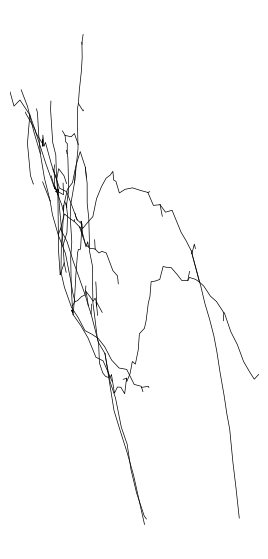

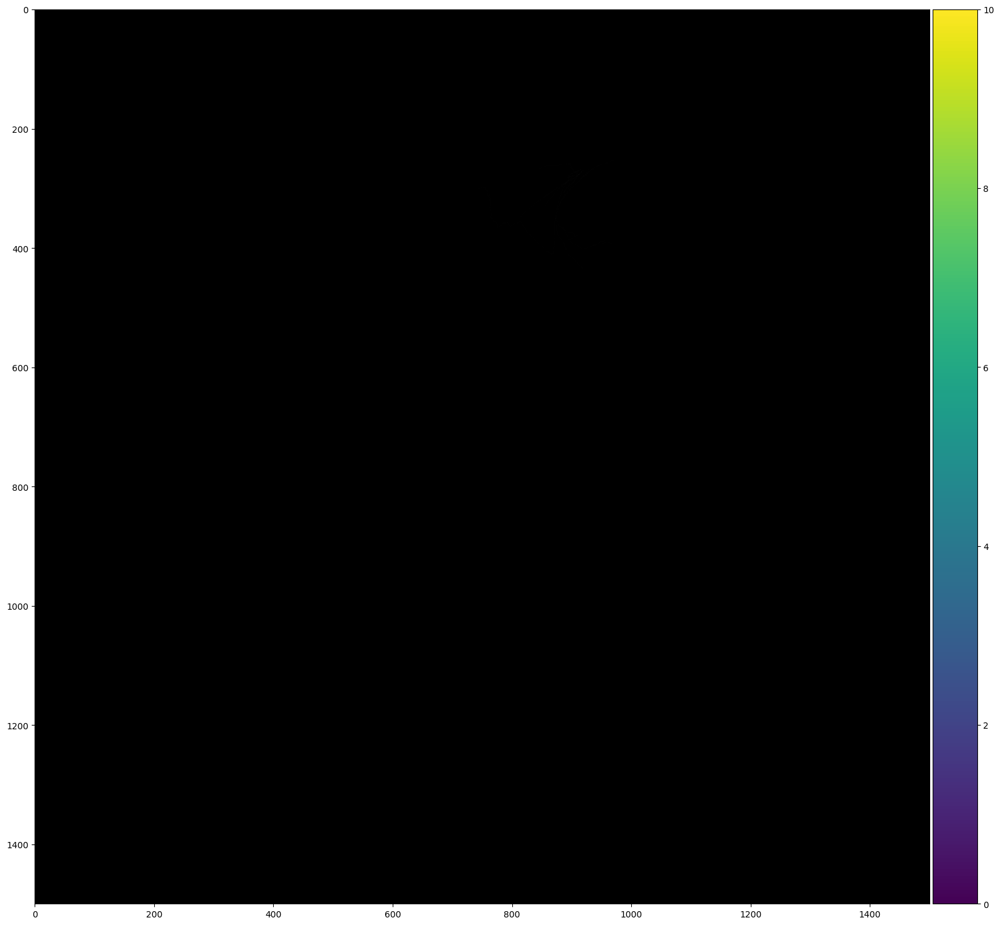

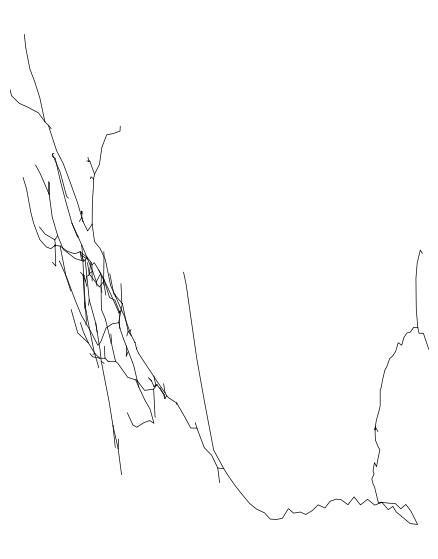

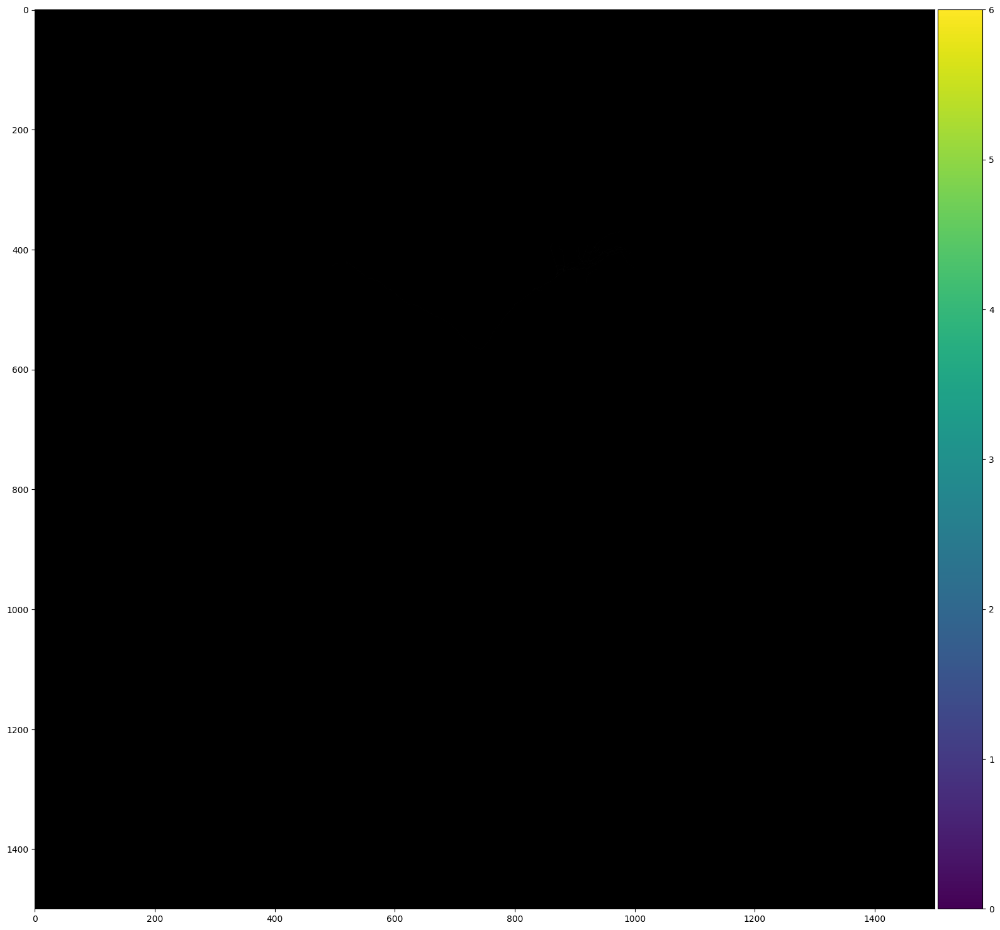

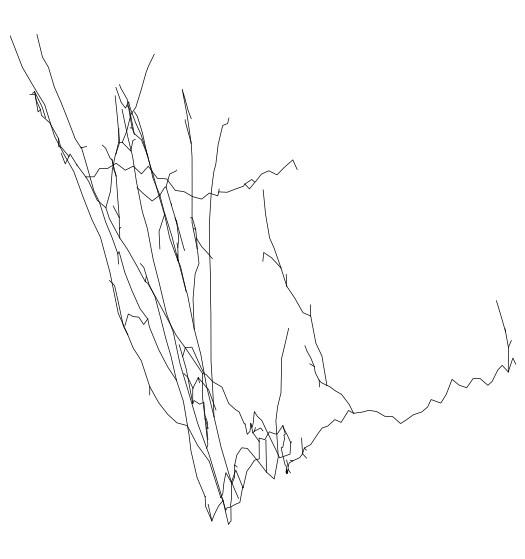

...

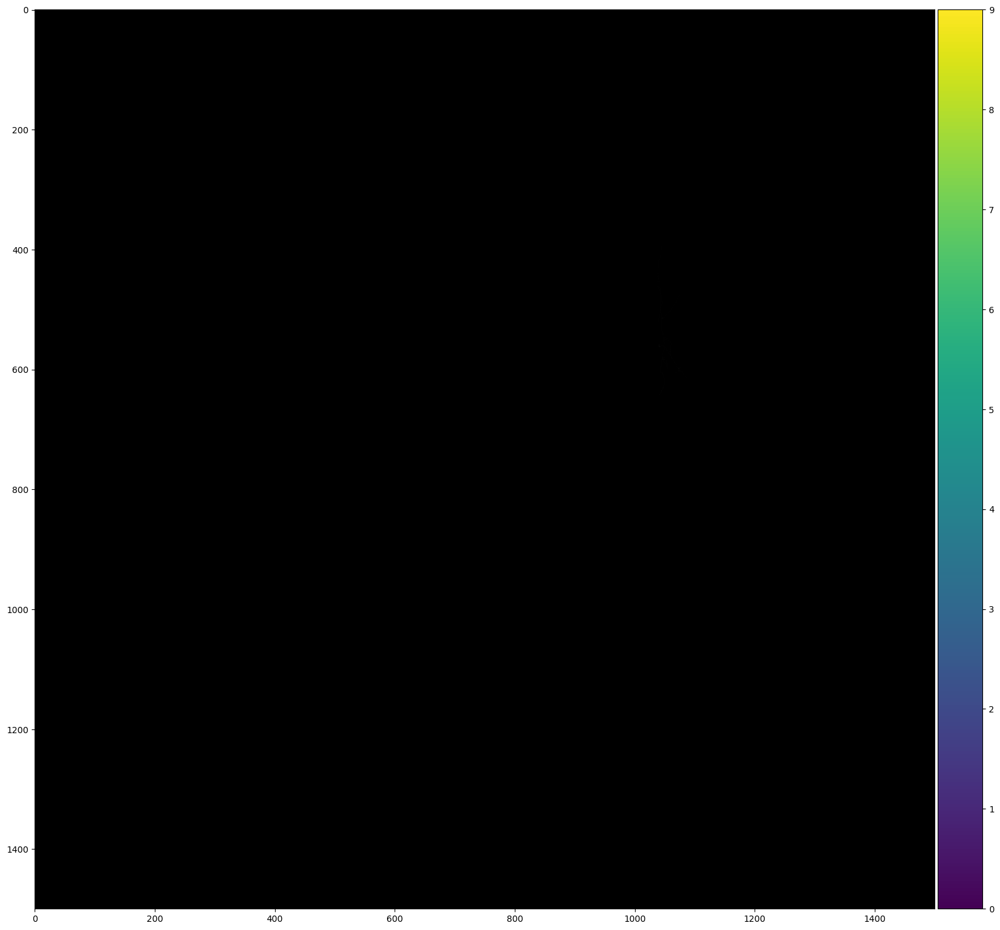

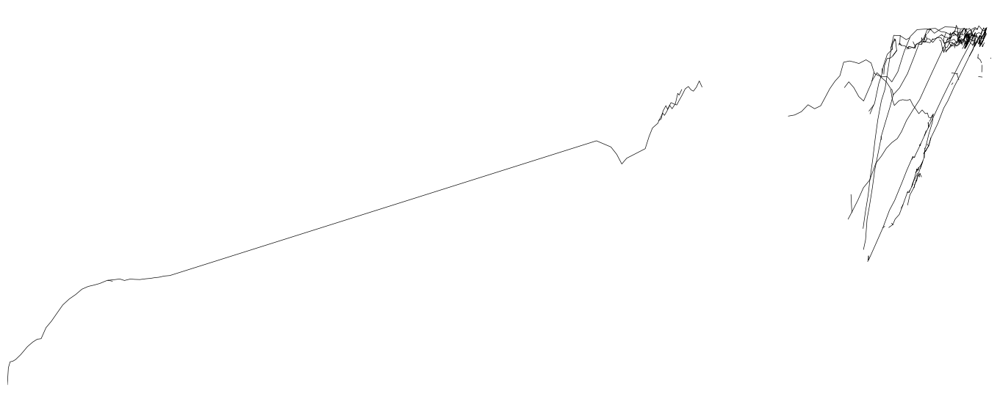

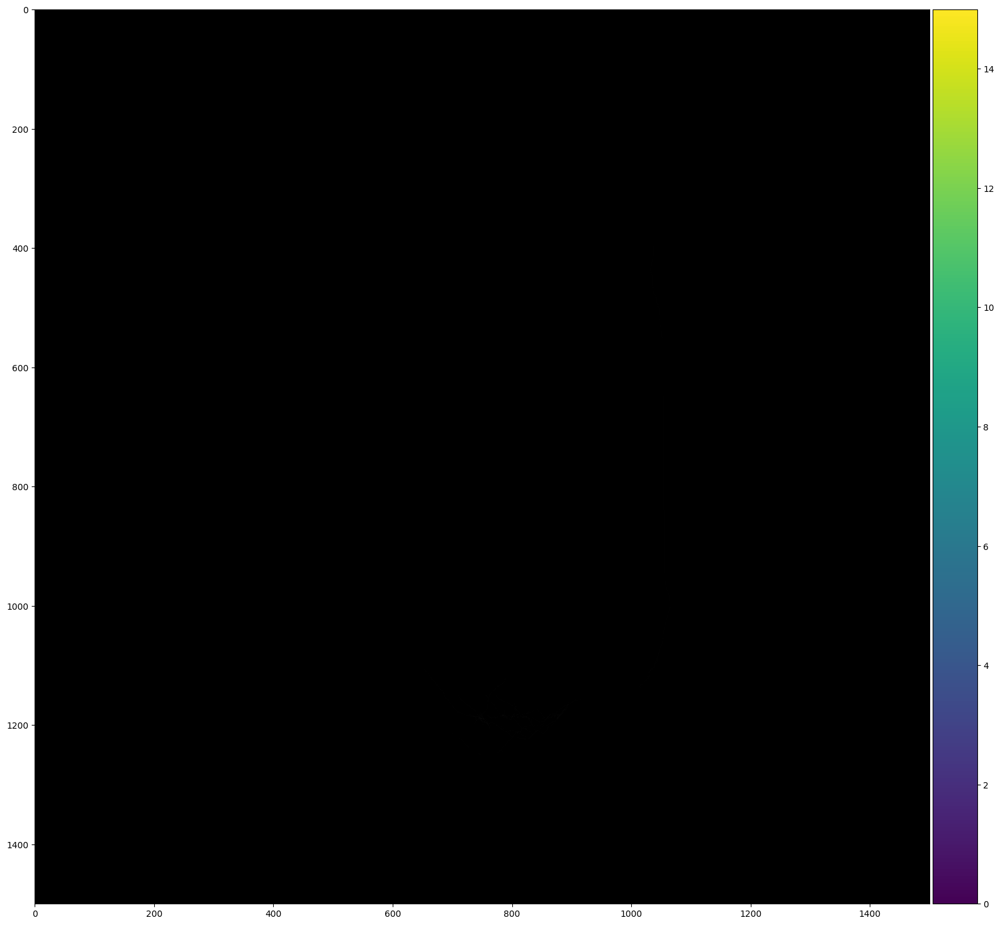

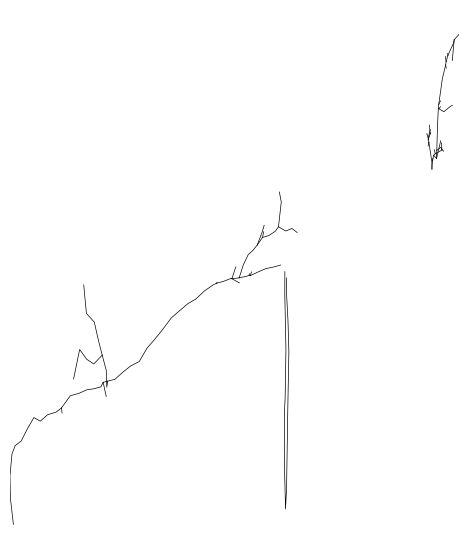

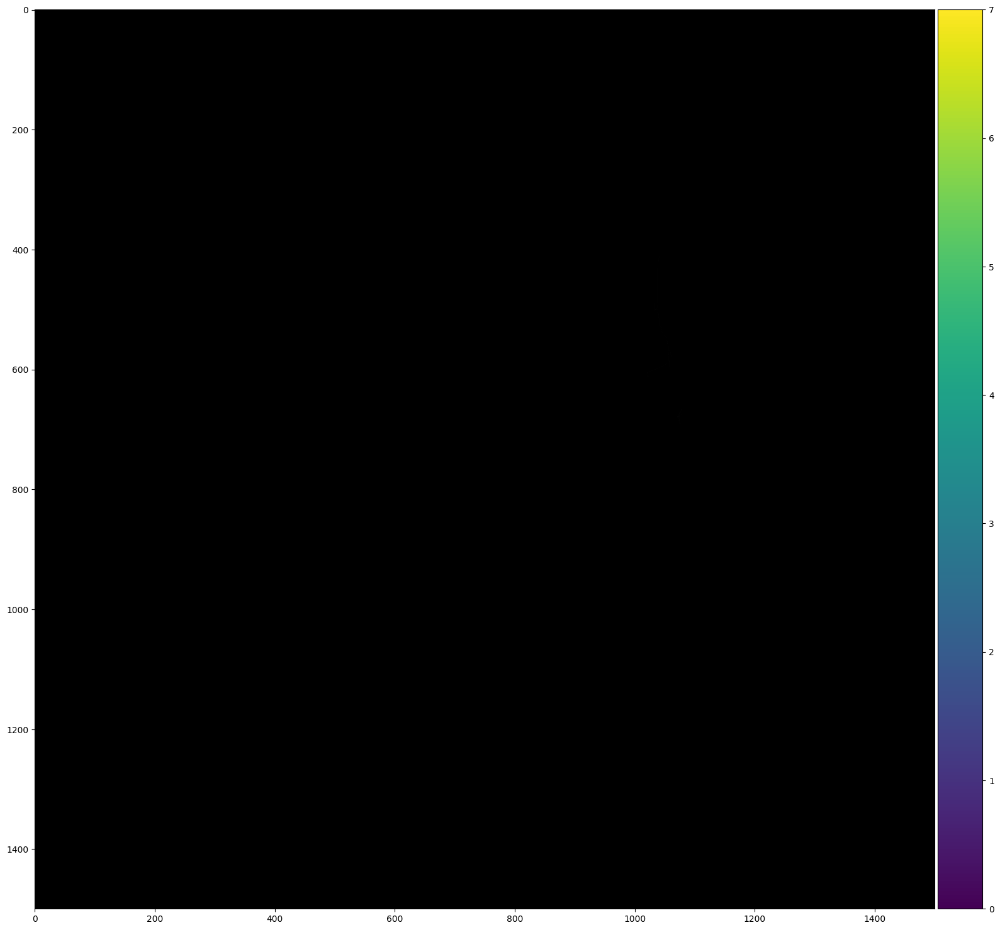

In [146]:
import FlatNeuron
from skimage import draw, io

grid,dv0,dv1,dv2,flatenPara = FlatNeuron.getStreamLine()
img0 = io.imread(r'../resource/flatmapedgebgd.png')
singleimg = img0
for i in range(max(cluster_eachNeuron['cluster_id'])):
    img0[:]=0
    neurons = cluster_eachNeuron.loc[cluster_eachNeuron['cluster_id']==(i+1)]
    neurons=neurons['ID']
    for neuron in neurons:
        # if Path("../resource/thsample/flatmap/"+neuron[0:-4]+'flatbgd.png').exists():
        #     continue
        singleimg[:]=0
        
        print(i,neuron)
        neurontree = iondata.getNeuronTreeByID(neuron[0:6], neuron[6:])
        FlatNeuron.flatneuron(neurontree,grid,dv0,dv1,dv2,flatenPara,sum=True,img=singleimg)
        io.imsave("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png',singleimg)
        # img0+=singleimg
    # io.imsave("../resource/thsample/flatmap/modulecluster"+str(i)+'flatbgd.png',img0)

In [148]:
## flat map
img0 = skimage.io.imread(r'../resource/flatmapedgebgd.png')
for i in range(max(cluster_eachNeuron['cluster_id'])):
    img0[:]=0
    neurons = cluster_eachNeuron.loc[cluster_eachNeuron['cluster_id']==(i+1)]
    neuronID=neurons['ID']
    print(i,(neuronID))
    for neuron in neuronID:
        singleimg = skimage.io.imread("../resource/thsample/flatmap_corticalcluster/"+neuron[0:-4]+'flatbgd.png')
        img0+=singleimg
    io.imsave("../resource/thsample/flatmap_corticalcluster/modulecluster2-"+str(i)+'flatbgd.png',img0)


0 3      220240031.swc
5      220240035.swc
11     220241019.swc
12     220241020.swc
13     220241021.swc
26     220241055.swc
27     220241056.swc
33     221624045.swc
35     221624048.swc
39     221624084.swc
43     221624179.swc
44     221624180.swc
45     221612003.swc
46     221612004.swc
47     221612006.swc
48     221612007.swc
49     221612008.swc
50     221612016.swc
51     221612018.swc
52     221612019.swc
53     221612020.swc
56     221612046.swc
57     221612062.swc
59     221612077.swc
61     221612079.swc
62     221612080.swc
80     221643026.swc
85     231628015.swc
93     231630004.swc
103    231630025.swc
Name: ID, dtype: object


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\33188045.py:11: UserWarning: ../resource/thsample/flatmap_corticalcluster/modulecluster2-0flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/modulecluster2-"+str(i)+'flatbgd.png',img0)


1 2      220240004.swc
6      220241010.swc
8      220241012.swc
9      220241015.swc
28     220241061.swc
34     221624047.swc
36     221624050.swc
41     221624097.swc
58     221612076.swc
60     221612078.swc
71     221643007.swc
72     221643011.swc
79     221643025.swc
81     231628005.swc
82     231628008.swc
87     231628031.swc
89     231629006.swc
90     231629008.swc
95     231630006.swc
96     231630008.swc
98     231630010.swc
99     231630011.swc
100    231630012.swc
101    231630023.swc
105    231630029.swc
106    231630030.swc
107    231630031.swc
Name: ID, dtype: object


C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\33188045.py:11: UserWarning: ../resource/thsample/flatmap_corticalcluster/modulecluster2-1flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/modulecluster2-"+str(i)+'flatbgd.png',img0)


2 0      210661077.swc
1      220240001.swc
4      220240033.swc
7      220241011.swc
10     220241018.swc
14     220241022.swc
15     220241024.swc
16     220241025.swc
17     220241026.swc
18     220241028.swc
19     220241029.swc
20     220241034.swc
21     220241035.swc
22     220241043.swc
23     220241046.swc
24     220241053.swc
25     220241054.swc
29     221624012.swc
30     221624013.swc
31     221624040.swc
32     221624044.swc
37     221624053.swc
38     221624054.swc
40     221624085.swc
42     221624169.swc
54     221612032.swc
55     221612033.swc
63     221625004.swc
64     221625009.swc
65     221625012.swc
66     221625013.swc
67     221625014.swc
68     221643001.swc
69     221643003.swc
70     221643006.swc
73     221643012.swc
74     221643014.swc
75     221643015.swc
76     221643018.swc
77     221643022.swc
78     221643023.swc
83     231628011.swc
84     231628012.swc
86     231628029.swc
88     231628033.swc
91     231629009.swc
92     231629010.swc
94     2316

C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\33188045.py:11: UserWarning: ../resource/thsample/flatmap_corticalcluster/modulecluster2-2flatbgd.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/modulecluster2-"+str(i)+'flatbgd.png',img0)


In [150]:
from skimage import draw, io
from skimage import filters
import numpy as np

lut = pd.read_csv('../resource/LUT.csv')
lut = lut.to_numpy()
lut=lut[:,1:4] # 按类数修改
print(lut[0])
maxvalue=0
imgbgd = io.imread(r'../resource/flatmapedgebgd.png')
for i in range(3):
    clusterimg = io.imread("../resource/thsample/flatmap_corticalcluster/modulecluster2-"+str(i)+'flatbgd.png')
    print(i,np.max(clusterimg))
    if np.max(clusterimg)==0:
        continue
    if maxvalue<np.max(clusterimg):
        maxvalue=np.max(clusterimg)
for i in range(3):
    if os.path.isfile("../resource/thsample/flatmap_corticalcluster/modulecluster2-"+str(i)+'flatbgd.png'):
        clusterimg = io.imread("../resource/thsample/flatmap_corticalcluster/modulecluster2-"+str(i)+'flatbgd.png')
        img = clusterimg*255/maxvalue
        img1 = filters.gaussian(img,sigma=4)
        img1 = img1[:,:,0]
        img2 = img1.reshape([img1.shape[0]*img1.shape[1]])
        # print(region)
        img2 = img2*40
        img2=img2.astype(np.int8)
        img3 = lut[img2]
        img4 = img3.reshape([img1.shape[0],img1.shape[1],3])
        img4[imgbgd[:,:,0]==0]=[0,0,0]
        io.imsave("../resource/thsample/flatmap_corticalcluster/module2"+str(i)+'flatblurwithoutregion.png',img4)

[255 255 255]
0 41
1 26
2 43


e:\anaconda\envs\neuronVis\lib\site-packages\skimage\_shared\utils.py:348: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
  return func(*args, **kwargs)
C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\2162210343.py:31: UserWarning: ../resource/thsample/flatmap_corticalcluster/module20flatblurwithoutregion.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/module2"+str(i)+'flatblurwithoutregion.png',img4)
Lossy conversion from int64 to uint8. Range [0, 255]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\WQM\AppData\Local\Temp\ipykernel_30732\2162210343.py:31: UserWarning: ../resource/thsample/flatmap_corticalcluster/module21flatblurwithoutregion.png is a low contrast image
  io.imsave("../resource/thsample/flatmap_corticalcluster/module2"+str(i)+'flatblurwithoutregion.png',img4)
Lossy conversion from int